# Importing Libraries

In [49]:
import seaborn
import sklearn
from sklearn import tree
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import roc_auc_score,roc_curve

In [50]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Dataset - Importing

In [51]:
df = pd.read_excel('/content/drive/MyDrive/Sales (1).xlsx',"Sales")

In [52]:
df

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore
0,7000000,4409,22.0,4.0,Agent,Salaried,Graduate,Female,3,Manager,2.0,Single,20993.0,1,2.0,806761.0,North,Half Yearly,5,2.0
1,7000001,2214,11.0,2.0,Third Party Partner,Salaried,Graduate,Male,4,Manager,4.0,Divorced,20130.0,0,3.0,294502.0,North,Yearly,7,3.0
2,7000002,4273,26.0,4.0,Agent,Free Lancer,Post Graduate,Male,4,Exe,3.0,Unmarried,17090.0,1,2.0,NaN,North,Yearly,0,3.0
3,7000003,1791,11.0,NaN,Third Party Partner,Salaried,Graduate,Fe male,3,Executive,3.0,Divorced,17909.0,1,2.0,268635.0,West,Half Yearly,0,5.0
4,7000004,2955,6.0,NaN,Agent,Small Business,UG,Male,3,Executive,4.0,Divorced,18468.0,0,4.0,366405.0,West,Half Yearly,2,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4515,7004515,3953,4.0,8.0,Agent,Small Business,Graduate,Male,4,Senior Manager,2.0,Single,26355.0,0,2.0,636473.0,West,Yearly,9,1.0
4516,7004516,2939,9.0,9.0,Agent,Salaried,Under Graduate,Female,2,Executive,2.0,Married,20991.0,0,3.0,296813.0,North,Yearly,1,3.0
4517,7004517,3792,23.0,23.0,Agent,Salaried,Engineer,Female,5,AVP,5.0,Single,NaN,0,2.0,667371.0,North,Half Yearly,4,1.0
4518,7004518,4816,10.0,10.0,Online,Small Business,Graduate,Female,4,Executive,2.0,Single,20068.0,0,6.0,943999.0,West,Half Yearly,1,5.0


# EDA

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   object 
 5   Occupation            4520 non-null   object 
 6   EducationField        4520 non-null   object 
 7   Gender                4520 non-null   object 
 8   ExistingProdType      4520 non-null   int64  
 9   Designation           4520 non-null   object 
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   object 
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   int64  
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

We see that there are categorical variables, therefore we will be converting them into labels

few of the rows of the dataset looks like this

In [54]:
df.head()

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore
0,7000000,4409,22.0,4.0,Agent,Salaried,Graduate,Female,3,Manager,2.0,Single,20993.0,1,2.0,806761.0,North,Half Yearly,5,2.0
1,7000001,2214,11.0,2.0,Third Party Partner,Salaried,Graduate,Male,4,Manager,4.0,Divorced,20130.0,0,3.0,294502.0,North,Yearly,7,3.0
2,7000002,4273,26.0,4.0,Agent,Free Lancer,Post Graduate,Male,4,Exe,3.0,Unmarried,17090.0,1,2.0,NaN,North,Yearly,0,3.0
3,7000003,1791,11.0,NaN,Third Party Partner,Salaried,Graduate,Fe male,3,Executive,3.0,Divorced,17909.0,1,2.0,268635.0,West,Half Yearly,0,5.0
4,7000004,2955,6.0,NaN,Agent,Small Business,UG,Male,3,Executive,4.0,Divorced,18468.0,0,4.0,366405.0,West,Half Yearly,2,5.0


In [55]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustID,4520.0,7.002260e+06,1304.955938,7000000.0,7001129.75,7002259.5,7003389.25,7004519.0
AgentBonus,4520.0,4.077838e+03,1403.321711,1605.0,3027.75,3911.5,4867.25,9608.0
Age,4251.0,1.449471e+01,9.037629,2.0,7.00,13.0,20.00,58.0
CustTenure,4294.0,1.446903e+01,8.963671,2.0,7.00,13.0,20.00,57.0
ExistingProdType,4520.0,3.688938e+00,1.015769,1.0,3.00,4.0,4.00,6.0
NumberOfPolicy,4475.0,3.565363e+00,1.455926,1.0,2.00,4.0,5.00,6.0
MonthlyIncome,4284.0,2.289031e+04,4885.600757,16009.0,19683.50,21606.0,24725.00,38456.0
Complaint,4520.0,2.871681e-01,0.452491,0.0,0.00,0.0,1.00,1.0
ExistingPolicyTenure,4336.0,4.130074e+00,3.346386,1.0,2.00,3.0,6.00,25.0
SumAssured,4366.0,6.199997e+05,246234.822140,168536.0,439443.25,578976.5,758236.00,1838496.0


there are 20 columns and 4520 rows

In [56]:
df.shape

(4520, 20)

# checking for null values

we see the following null values

In [57]:
df.isnull().sum()

,0
CustID,0
AgentBonus,0
Age,269
CustTenure,226
Channel,0
Occupation,0
EducationField,0
Gender,0
ExistingProdType,0
Designation,0


# Check For Duplicate

In [58]:
duplicate = df.duplicated()
duplicate.sum()

np.int64(0)

no duplicates

# Changing the categorical variables into numerical classes

In [59]:
from sklearn import preprocessing

# lets use the preprocessing's LabelEncoder
label_encoder = preprocessing.LabelEncoder()

df['EducationField']= label_encoder.fit_transform(df['EducationField'])
df['Gender']= label_encoder.fit_transform(df['Gender'])
df['Channel']= label_encoder.fit_transform(df['Channel'])
df['Occupation']= label_encoder.fit_transform(df['Occupation'])
df['MaritalStatus']= label_encoder.fit_transform(df['MaritalStatus'])
df['Zone']= label_encoder.fit_transform(df['Zone'])
df['Designation']= label_encoder.fit_transform(df['Designation'])
df['PaymentMethod']= label_encoder.fit_transform(df['PaymentMethod'])

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   int64  
 5   Occupation            4520 non-null   int64  
 6   EducationField        4520 non-null   int64  
 7   Gender                4520 non-null   int64  
 8   ExistingProdType      4520 non-null   int64  
 9   Designation           4520 non-null   int64  
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   int64  
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   int64  
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

In [61]:
df.head()

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore
0,7000000,4409,22.0,4.0,0,3,2,1,3,3,2.0,2,20993.0,1,2.0,806761.0,1,0,5,2.0
1,7000001,2214,11.0,2.0,2,3,2,2,4,3,4.0,0,20130.0,0,3.0,294502.0,1,3,7,3.0
2,7000002,4273,26.0,4.0,0,0,4,2,4,1,3.0,3,17090.0,1,2.0,NaN,1,3,0,3.0
3,7000003,1791,11.0,NaN,2,3,2,0,3,2,3.0,0,17909.0,1,2.0,268635.0,3,0,0,5.0
4,7000004,2955,6.0,NaN,0,4,5,2,3,2,4.0,0,18468.0,0,4.0,366405.0,3,0,2,5.0


# Dealing with missing Values

In [62]:
from statistics import mode

df.loc[:, 'Age'] = df['Age'].fillna(df['Age'].mode().iloc[0])
df.loc[:, 'CustTenure'] = df['CustTenure'].fillna(df['CustTenure'].mode().iloc[0])
df.loc[:, 'MonthlyIncome'] = df['MonthlyIncome'].fillna(df['MonthlyIncome'].mean())
df.loc[:, 'ExistingPolicyTenure'] = df['ExistingPolicyTenure'].fillna(df['ExistingPolicyTenure'].mode().iloc[0])
df.loc[:, 'SumAssured'] = df['SumAssured'].fillna(df['SumAssured'].mean())
df.loc[:, 'CustCareScore'] = df['CustCareScore'].fillna(df['CustCareScore'].mode().iloc[0])
df.loc[:, 'NumberOfPolicy'] = df['NumberOfPolicy'].fillna(df['NumberOfPolicy'].mode().iloc[0])


In [63]:
df.isnull().sum()

,0
CustID,0
AgentBonus,0
Age,0
CustTenure,0
Channel,0
Occupation,0
EducationField,0
Gender,0
ExistingProdType,0
Designation,0


We removed all the missing values

# Univariate analysis

### We will do the analysis before and after the removal of outliers

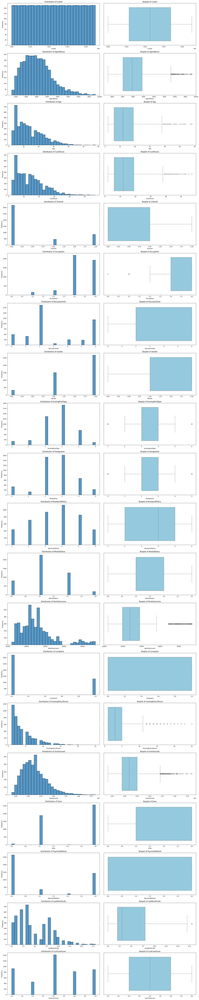

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get only numerical columns
num_cols = df.select_dtypes(exclude='object').columns
n_rows = len(num_cols)
n_cols = 2  # One distribution plot and one boxplot per variable

plt.figure(figsize=(20, 5 * n_rows))

plot_num = 1

for col in num_cols:
    plt.subplot(n_rows, n_cols, plot_num)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    sns.histplot(df[col].dropna(), bins=30, edgecolor='black')
    plot_num += 1


    plt.subplot(n_rows, n_cols, plot_num)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    sns.boxplot(x=df[col].dropna(), color='skyblue')
    plot_num += 1

plt.tight_layout()
plt.show()

# Dealing with Outliers

In [65]:
for col in df.select_dtypes(include=[np.number]).columns:
    Q1 = np.percentile(df[col].dropna(), 25)
    Q3 = np.percentile(df[col].dropna(), 75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    df[col] = np.clip(df[col], lower, upper)

# After removal of Outliers

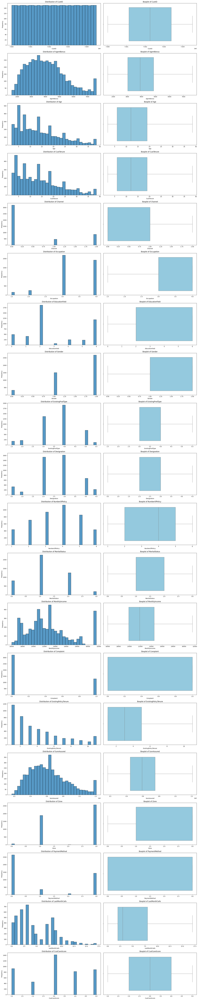

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get only numerical columns
num_cols = df.select_dtypes(exclude='object').columns
n_rows = len(num_cols)
n_cols = 2  # One distribution plot and one boxplot per variable

plt.figure(figsize=(20, 5 * n_rows))

plot_num = 1

for col in num_cols:
    plt.subplot(n_rows, n_cols, plot_num)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    sns.histplot(df[col].dropna(), bins=30, edgecolor='black')
    plot_num += 1

    plt.subplot(n_rows, n_cols, plot_num)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    sns.boxplot(x=df[col].dropna(), color='skyblue')
    plot_num += 1

plt.tight_layout()
plt.show()

# Bivaraite analysis

# Correlation analysis

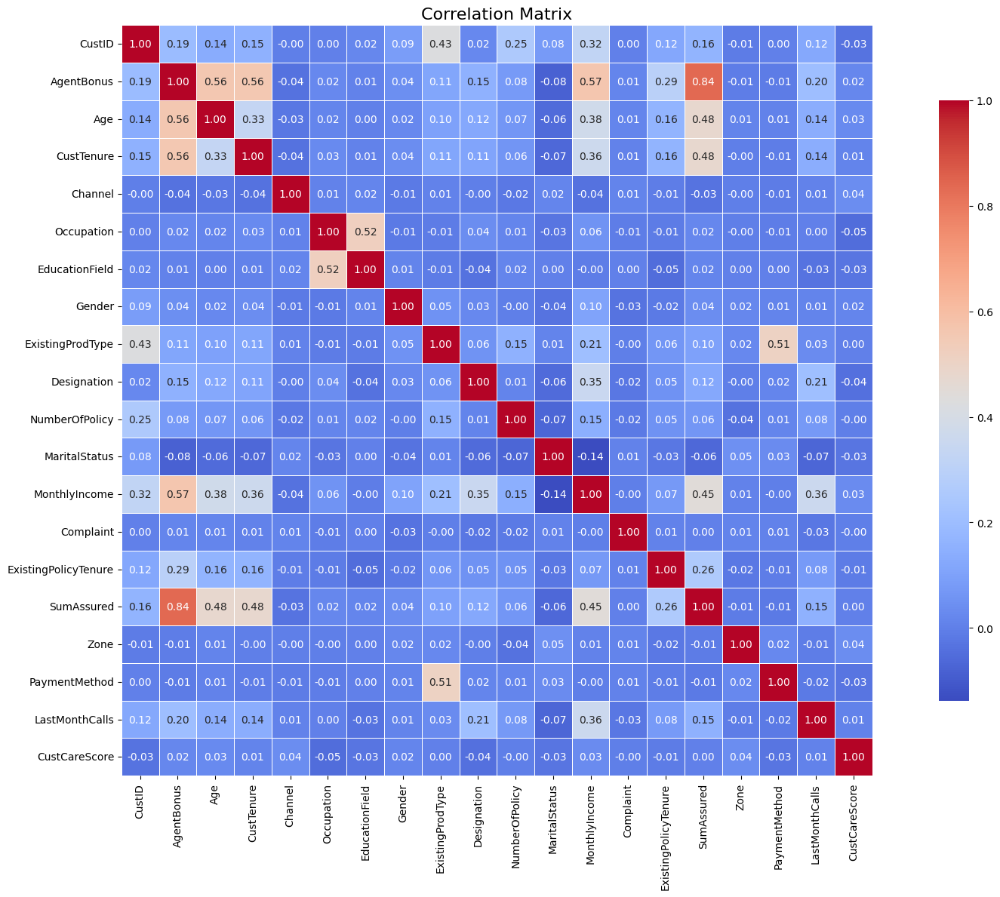

In [67]:
plt.figure(figsize=(18, 12))
sns.heatmap(
    df.corr(numeric_only=True),  # ensures no warning about object columns
    annot=True,
    fmt=".2f",
    cmap='coolwarm',  # better contrast
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation Matrix", fontsize=16)
plt.tight_layout()
plt.show()

In [68]:
df.columns

Index(['CustID', 'AgentBonus', 'Age', 'CustTenure', 'Channel', 'Occupation',
       'EducationField', 'Gender', 'ExistingProdType', 'Designation',
       'NumberOfPolicy', 'MaritalStatus', 'MonthlyIncome', 'Complaint',
       'ExistingPolicyTenure', 'SumAssured', 'Zone', 'PaymentMethod',
       'LastMonthCalls', 'CustCareScore'],
      dtype='object')

<Figure size 11000x9000 with 0 Axes>

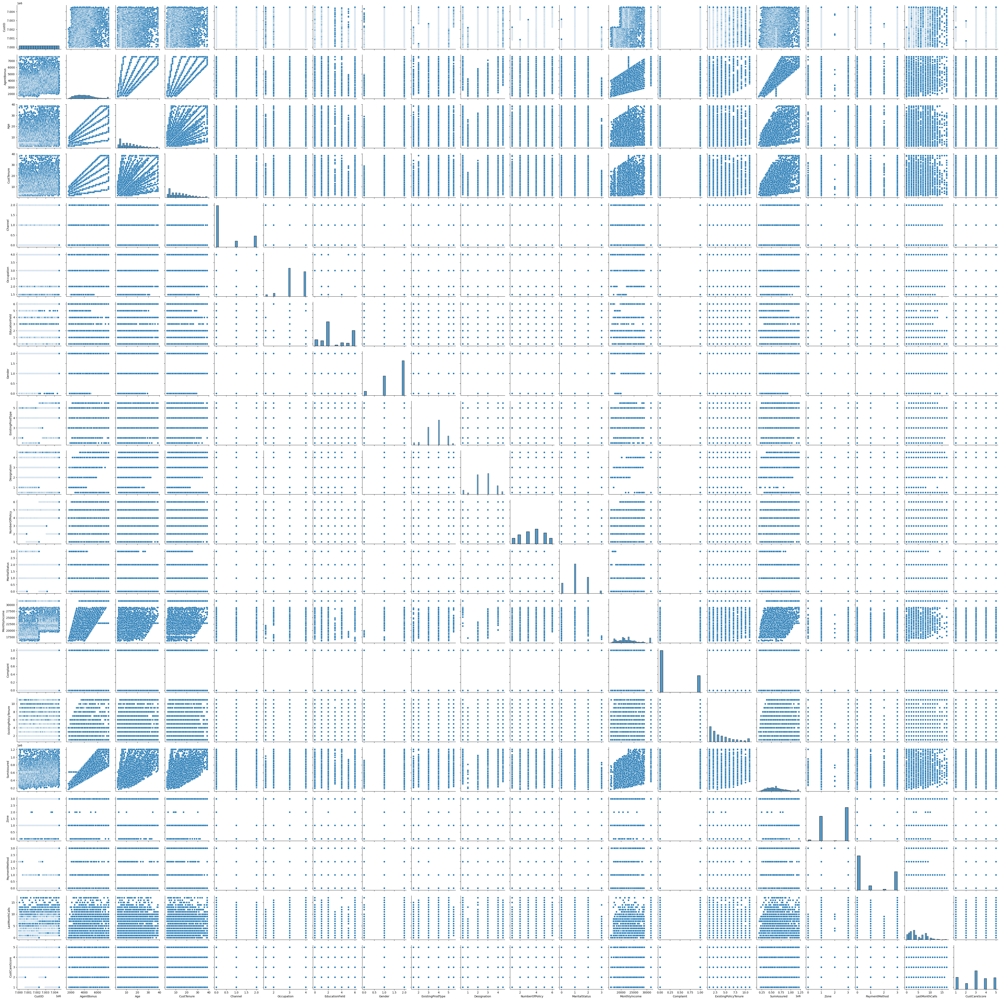

In [69]:
plt.figure(figsize=(110,90))
sns.pairplot(df,diag_kind='hist')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

Lets see which 2 variables are related to each other

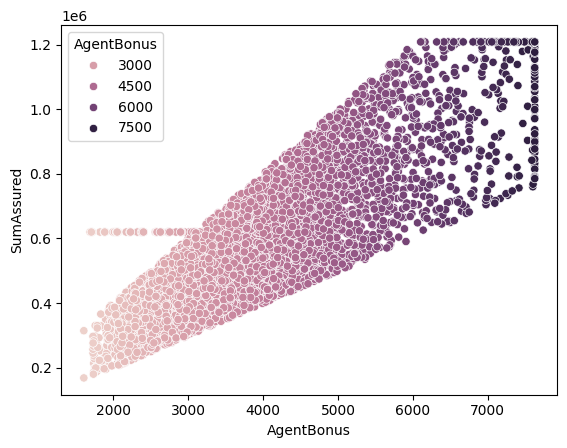

In [70]:
sns.scatterplot(x='AgentBonus',y='SumAssured',data=df,hue='AgentBonus');

<Axes: xlabel='AgentBonus', ylabel='CustTenure'>

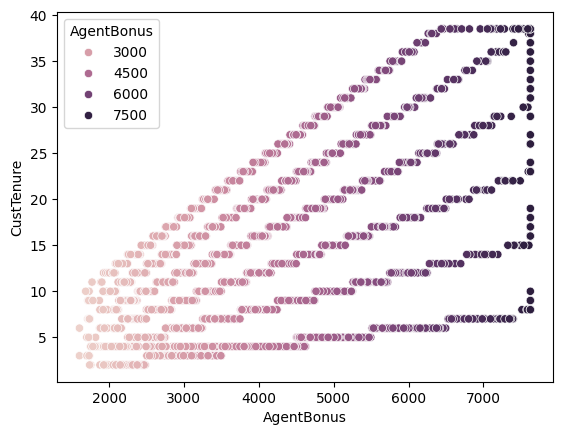

In [71]:
sns.scatterplot(x='AgentBonus',y='CustTenure',data=df,hue='AgentBonus')

<Axes: xlabel='AgentBonus', ylabel='ExistingPolicyTenure'>

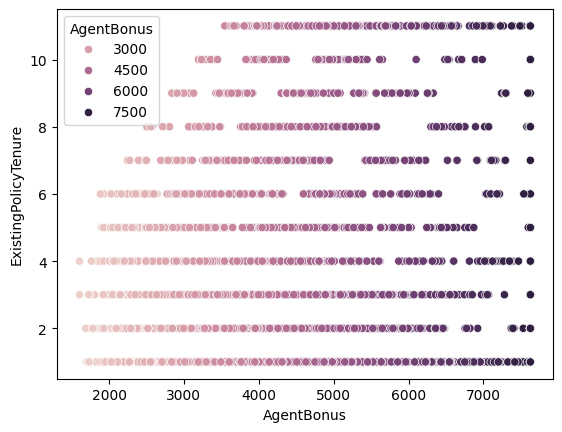

In [72]:
sns.scatterplot(x='AgentBonus',y='ExistingPolicyTenure',data=df,hue='AgentBonus')

<Axes: xlabel='AgentBonus', ylabel='MonthlyIncome'>

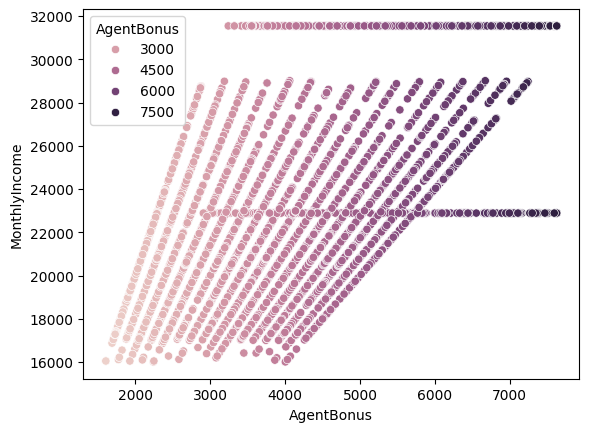

In [73]:
sns.scatterplot(x='AgentBonus',y='MonthlyIncome',data=df,hue='AgentBonus')

<Axes: xlabel='AgentBonus', ylabel='Occupation'>

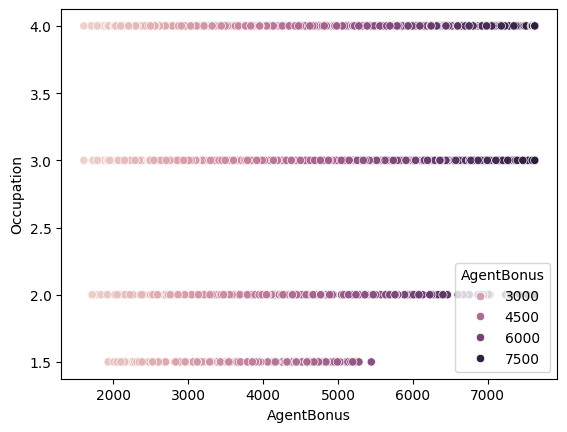

In [74]:
sns.scatterplot(x='AgentBonus',y='Occupation',data=df,hue='AgentBonus')

<Axes: xlabel='AgentBonus', ylabel='Age'>

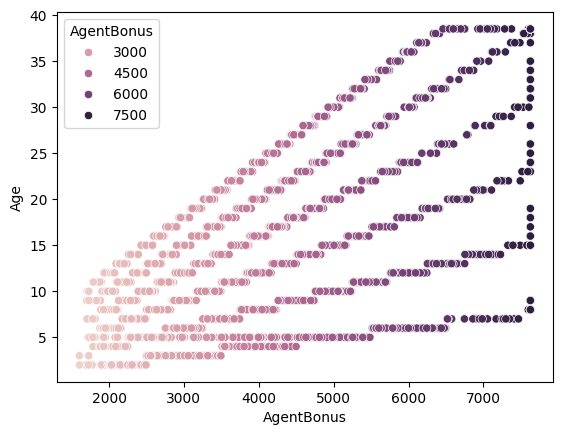

In [75]:
sns.scatterplot(x='AgentBonus',y='Age',data=df,hue='AgentBonus')

# Bivaraite Analysis Focusing on AgentBonus (targetVariable)

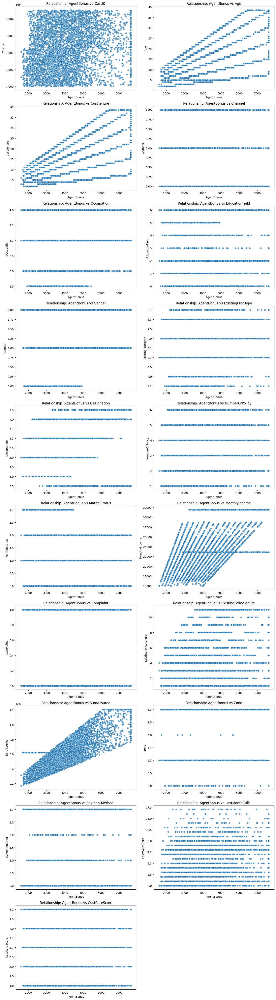

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical columns excluding 'AgentBonus'
numeric_features = df.select_dtypes(include='number').columns
features_to_plot = [col for col in numeric_features if col != 'AgentBonus']

# Layout setup
n_features = len(features_to_plot)
plots_per_row = 2
fig = plt.figure(figsize=(14, 5 * n_features))

plot_number = 1

for feature in features_to_plot:
    ax = fig.add_subplot(n_features, plots_per_row, plot_number)
    sns.scatterplot(data=df, x='AgentBonus', y=feature, ax=ax, s=40, alpha=0.7)
    ax.set_title(f'Relationship: AgentBonus vs {feature}', fontsize=12)
    ax.set_xlabel('AgentBonus')
    ax.set_ylabel(feature)
    plot_number += 1

plt.tight_layout()
plt.show()


# Other Variables ??

/tmp/ipython-input-77-3755852050.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Age', data=df, palette='mako', edgecolor='black', linewidth=1.5)


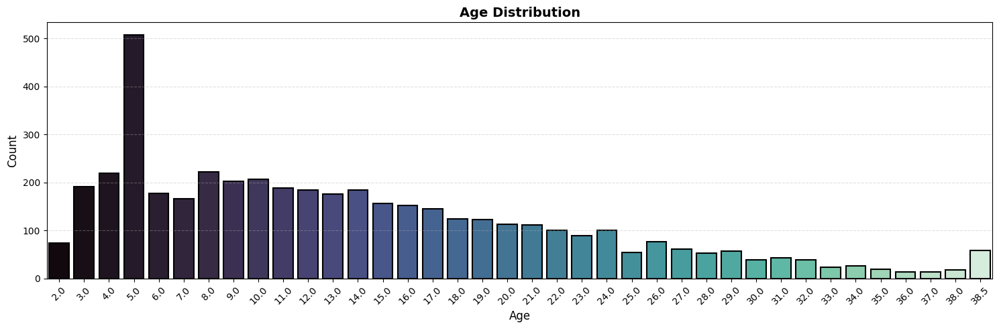

In [77]:
plt.figure(figsize=(15, 5))
sns.countplot(x='Age', data=df, palette='mako', edgecolor='black', linewidth=1.5)
plt.title('Age Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show();

/tmp/ipython-input-78-3257932169.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='CustTenure', data=df, palette='mako', edgecolor='black', linewidth=1.5)


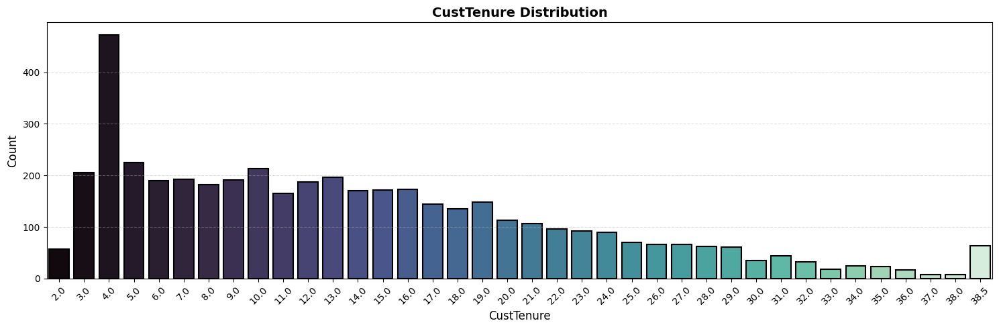

In [78]:
plt.figure(figsize=(15, 5))
sns.countplot(x='CustTenure', data=df, palette='mako', edgecolor='black', linewidth=1.5)
plt.title('CustTenure Distribution', fontsize=14, fontweight='bold')
plt.xlabel('CustTenure', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show();

/tmp/ipython-input-79-3274955866.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Zone', data=df, palette='mako', edgecolor='black', linewidth=1.5)


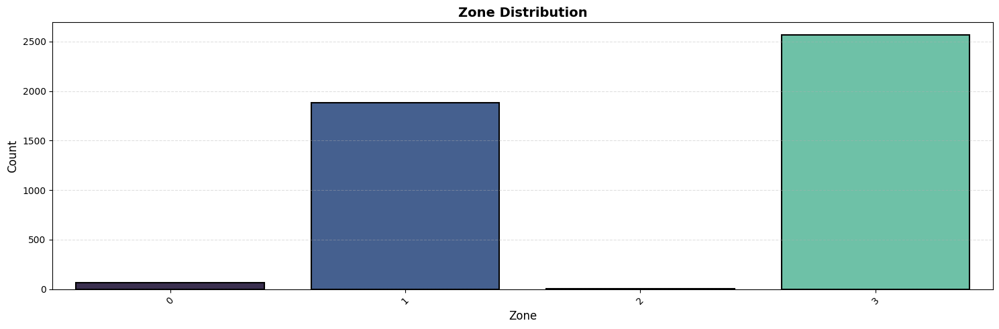

In [79]:
plt.figure(figsize=(15, 5))
sns.countplot(x='Zone', data=df, palette='mako', edgecolor='black', linewidth=1.5)
plt.title('Zone Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Zone', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

/tmp/ipython-input-80-2071695284.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Channel', data=df, palette='mako', edgecolor='black', linewidth=1.5)


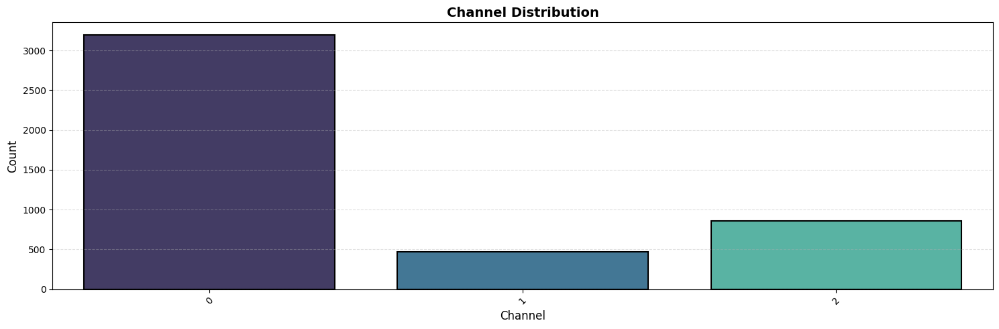

In [80]:
plt.figure(figsize=(15, 5))
sns.countplot(x='Channel', data=df, palette='mako', edgecolor='black', linewidth=1.5)
plt.title('Channel Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Channel', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

/tmp/ipython-input-81-3686282427.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='PaymentMethod', data=df, palette='mako', edgecolor='black', linewidth=1.5)


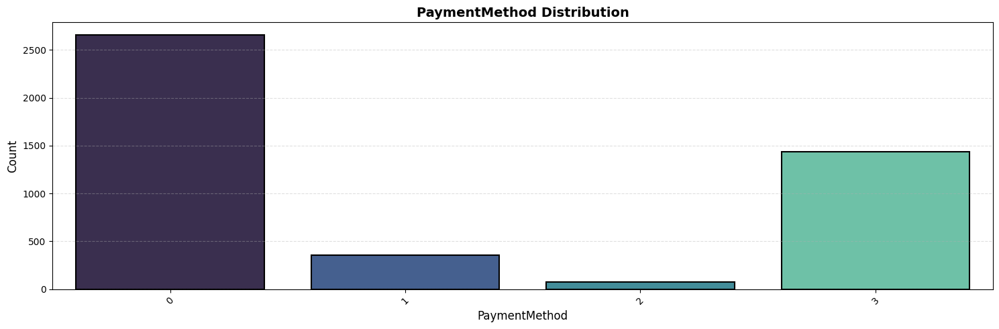

In [81]:
plt.figure(figsize=(15, 5))
sns.countplot(x='PaymentMethod', data=df, palette='mako', edgecolor='black', linewidth=1.5)
plt.title('PaymentMethod Distribution', fontsize=14, fontweight='bold')
plt.xlabel('PaymentMethod', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# K - Means Clustering

In [82]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


# normalizing (x- mean / std_dev)
X=StandardScaler()

scaled_df=X.fit_transform(df)

In [83]:
scaled_df.shape

(4520, 20)

We need to find the value of K in K means clustering

To do this we implement the Elbow method

In [84]:
within_cluster_sum_of_squares=[]
for i in range(1,25):
    K_means = KMeans(n_clusters=i)
    K_means.fit(scaled_df)
    within_cluster_sum_of_squares.append(K_means.inertia_)

In [85]:
within_cluster_sum_of_squares

[90400.00000000001,
 80018.01001380876,
 76115.57725227029,
 72861.48215768355,
 70773.23039698479,
 68904.27970473202,
 67533.53538264823,
 67108.98476923432,
 65028.69473852014,
 64449.03399513988,
 63622.274966996134,
 61878.41575439602,
 62459.43272924871,
 60803.08391454633,
 60277.78585011897,
 59367.080264549855,
 59123.54492686889,
 58423.170720577225,
 58249.331857566474,
 57453.035968411314,
 57233.11997000438,
 56904.75727889745,
 56441.44734193753,
 55822.15681193825]

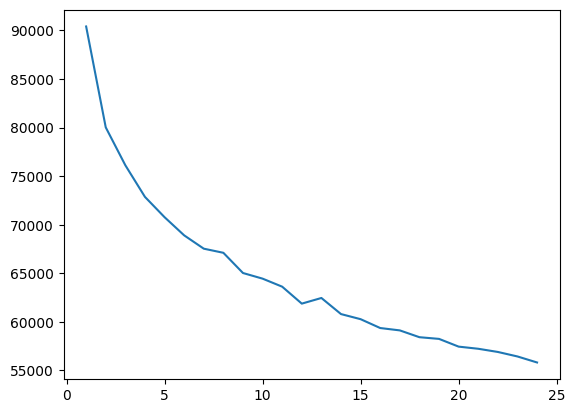

In [86]:
plt.plot(range(1,25),within_cluster_sum_of_squares)

Elbow was formed at K = 3

Lets proceed with k = 3

In [87]:
k_means=KMeans(n_clusters=3)
k_means.fit(scaled_df)
labels=k_means.labels_

In [88]:
df["Customer_category"] =labels
df.head(5)

,CustID,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,...,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore,Customer_category
0,7000000,4409.0,22.0,4.0,0,3.0,2,1,3.0,3.0,...,2,20993.0,1,2.0,806761.000000,1,0,5,2.0,2
1,7000001,2214.0,11.0,2.0,2,3.0,2,2,4.0,3.0,...,0,20130.0,0,3.0,294502.000000,1,3,7,3.0,0
2,7000002,4273.0,26.0,4.0,0,1.5,4,2,4.0,1.0,...,3,17090.0,1,2.0,619999.699267,1,3,0,3.0,0
3,7000003,1791.0,11.0,4.0,2,3.0,2,0,3.0,2.0,...,0,17909.0,1,2.0,268635.000000,3,0,0,5.0,2
4,7000004,2955.0,6.0,4.0,0,4.0,5,2,3.0,2.0,...,0,18468.0,0,4.0,366405.000000,3,0,2,5.0,2


In [89]:
df["Customer_category"].value_counts()

,count
Customer_category,
0,1781
2,1385
1,1354


In [90]:
df.to_csv('df.csv')

# Part 2
### Lets Train more models and see what we can extract from that


In [91]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

In [92]:
df.drop(['CustID'],axis=1,inplace=True)

In [93]:
X = df.drop(['AgentBonus'], axis=1)
y = df['AgentBonus']

For validation we need to split the data into train and test set

In [94]:
# Split X and y into training and test set in 75:25 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25 , random_state=1)

In [95]:
print("Train data",X_train.shape)
print("Test Data",X_test.shape)

Train data (3390, 19)
Test Data (1130, 19)


# Linear Regression

In [96]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [97]:
# Train and test scores (R²)
train_score = regression_model.score(X_train, y_train)
test_score = regression_model.score(X_test, y_test)

# Predictions
y_train_pred = regression_model.predict(X_train)
y_test_pred = regression_model.predict(X_test)

# RMSE
rmse_train = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(metrics.mean_squared_error(y_test, y_test_pred))

# Print neatly
print("Model Evaluation:")
print(f"R² Score (Train): {train_score:.4f}")
print(f"R² Score (Test) : {test_score:.4f}")
print(f"RMSE (Train)     : {rmse_train:.2f}")
print(f"RMSE (Test)      : {rmse_test:.2f}")

Model Evaluation:
R² Score (Train): 0.7989
R² Score (Test) : 0.7750
RMSE (Train)     : 612.81
RMSE (Test)      : 632.24


In [98]:
df.columns

Index(['AgentBonus', 'Age', 'CustTenure', 'Channel', 'Occupation',
       'EducationField', 'Gender', 'ExistingProdType', 'Designation',
       'NumberOfPolicy', 'MaritalStatus', 'MonthlyIncome', 'Complaint',
       'ExistingPolicyTenure', 'SumAssured', 'Zone', 'PaymentMethod',
       'LastMonthCalls', 'CustCareScore', 'Customer_category'],
      dtype='object')

In [99]:
relation ='AgentBonus ~ Age + CustTenure + ExistingProdType + NumberOfPolicy + MonthlyIncome + Complaint + ExistingPolicyTenure + SumAssured + LastMonthCalls + CustCareScore + Channel +  Occupation + EducationField + Gender + Designation + MaritalStatus + Zone + PaymentMethod'

In [100]:
!pip install statsmodels

In [101]:
data_train = pd.concat([X_train, y_train], axis=1)
data_test=pd.concat([X_test,y_test],axis=1)
data_train.head()

,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore,Customer_category,AgentBonus
693,17.0,15.0,0,2.0,1,2,3.0,3.0,2.0,1,22379.000000,0,1.0,570217.0,3,0,4,2.0,2,2909.0
3521,18.0,14.0,0,3.0,2,1,5.0,0.5,5.0,1,22890.309991,0,2.0,398096.0,3,3,11,5.0,0,3523.0
3789,27.0,11.0,0,1.5,1,2,4.0,3.0,2.0,1,21776.000000,0,4.0,1034360.0,1,0,8,3.0,1,5444.0
2051,4.0,4.0,2,3.0,4,2,3.0,2.0,3.0,1,17821.000000,0,9.0,568846.0,3,0,2,3.0,2,3742.0
2404,15.0,15.0,2,4.0,0,2,5.0,3.0,3.0,2,23139.000000,0,1.0,704583.0,3,3,2,3.0,0,4859.0


In [102]:
import statsmodels.formula.api as smf
lm1 = smf.ols(formula= relation, data = data_train).fit()
lm1.params

,0
Intercept,-250.813323
Age,21.651948
CustTenure,22.202274
ExistingProdType,-46.981027
NumberOfPolicy,1.169160
MonthlyIncome,0.070806
Complaint,25.917164
ExistingPolicyTenure,38.146958
SumAssured,0.003529
LastMonthCalls,-1.085980


In [103]:
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:             AgentBonus   R-squared:                       0.798
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     741.1
Date:                Fri, 04 Jul 2025   Prob (F-statistic):               0.00
Time:                        07:38:15   Log-Likelihood:                -26572.
No. Observations:                3390   AIC:                         5.318e+04
Df Residuals:                    3371   BIC:                         5.330e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept             -250.8133 

In [104]:
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]]
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=smf.ols(formula="y~x", data=x_vars).fit().rsquared
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [105]:
vif_cal(df.drop('AgentBonus',axis=1))

Age  VIF =  1.38
CustTenure  VIF =  1.37
Channel  VIF =  1.01
Occupation  VIF =  1.39
EducationField  VIF =  1.39
Gender  VIF =  1.03
ExistingProdType  VIF =  2.23
Designation  VIF =  1.17
NumberOfPolicy  VIF =  1.07
MaritalStatus  VIF =  1.03
MonthlyIncome  VIF =  1.79
Complaint  VIF =  1.0
ExistingPolicyTenure  VIF =  1.1
SumAssured  VIF =  1.73
Zone  VIF =  1.01
PaymentMethod  VIF =  1.43
LastMonthCalls  VIF =  1.17
CustCareScore  VIF =  1.01
Customer_category  VIF =  2.14


In [106]:
y_pred_1_Train = lm1.fittedvalues
y_pred_1_Test = lm1.predict(data_test)


In [107]:
from sklearn.metrics import mean_squared_error

print('RMSE on Training Set:', (mean_squared_error(y_true=data_train['AgentBonus'],y_pred=y_pred_1_Train))**0.5)

RMSE on Training Set: 613.7183214322932


In [108]:
print('RMSE on Test Set:', (mean_squared_error(y_true=data_test['AgentBonus'],y_pred=y_pred_1_Test))**0.5)

RMSE on Test Set: 632.5738859836075


# Decision Tree

Lets do the grid search now for the max_depth, samples in leaf and sample splits

In [109]:
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
}

dtr=tree.DecisionTreeRegressor(random_state=123)

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 3)


grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 40}


In [110]:
dtr = tree.DecisionTreeRegressor(max_depth=10,min_samples_split=35,min_samples_leaf=3,random_state=123)

# Random Forest

In [111]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

In [112]:
param_grid = {
    'max_depth': [7,10],
    'max_features': [4, 6],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [30, 50,100],
    'n_estimators': [300, 500]
}

rfr = RandomForestRegressor(random_state=123)

grid_search = GridSearchCV(estimator = rfr, param_grid = param_grid, cv = 3)
grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'max_depth': 10, 'max_features': 6, 'min_samples_leaf': 3, 'min_samples_split': 30, 'n_estimators': 500}


In [113]:
rfr = RandomForestRegressor(max_depth=10, max_features=6,
                            min_samples_leaf= 3,
                            min_samples_split= 30, n_estimators= 500,
                            random_state=123)

# KNN Regression

In [114]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid for KNN
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # p=1 for Manhattan, p=2 for Euclidean distance
}

# Initialize KNN regressor
knn = KNeighborsRegressor()

# Set up GridSearchCV
grid_search_knn = GridSearchCV(estimator=knn, param_grid=param_grid_knn, cv=3)

# Fit to training data
grid_search_knn.fit(X_train, y_train)

# Display the best parameters found
print("Best parameters for KNN Regressor:")
print(grid_search_knn.best_params_)

Best parameters for KNN Regressor:
{'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


In [115]:
knn_model = KNeighborsRegressor(
    n_neighbors=9,
    weights='uniform',
    p=1
)

In [116]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import pandas as pd
import numpy as np

In [117]:
ss=StandardScaler()
# we are scaling the data for KNN.
x_train_scaled=ss.fit_transform(X_train)
x_test_scaled=ss.transform(X_test)

In [118]:
models = [
    ("Linear Regression", regression_model),
    ("Decision Tree Regressor", dtr),
    ("Random Forest Regressor", rfr),
    ("KNN Regressor", knn_model)
]

# Initialize result containers
results = {
    'Model': [],
    'Train RMSE': [],
    'Test RMSE': [],
    'Train R²': [],
    'Test R²': [],
    'Train MAPE': [],
    'Test MAPE': []
}

# Evaluate models
for name, model in models:
    if name == "KNN Regressor":
        model.fit(x_train_scaled, y_train)
        y_train_pred = model.predict(x_train_scaled)
        y_test_pred = model.predict(x_test_scaled)
    else:
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

    results['Model'].append(name)
    results['Train RMSE'].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    results['Test RMSE'].append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    results['Train R²'].append(model.score(x_train_scaled if name == "KNN Regressor" else X_train, y_train))
    results['Test R²'].append(model.score(x_test_scaled if name == "KNN Regressor" else X_test, y_test))
    results['Train MAPE'].append(mean_absolute_percentage_error(y_train, y_train_pred))
    results['Test MAPE'].append(mean_absolute_percentage_error(y_test, y_test_pred))

# Display as DataFrame
summary_df = pd.DataFrame(results).set_index('Model')
print(summary_df.round(3))

                         Train RMSE  Test RMSE  Train R²  Test R²  Train MAPE  \
Model                                                                           
Linear Regression           612.811    632.239     0.799    0.775       0.127   
Decision Tree Regressor     461.206    598.495     0.886    0.798       0.093   
Random Forest Regressor     459.933    530.771     0.887    0.841       0.097   
KNN Regressor               665.940    765.060     0.762    0.671       0.141   

                         Test MAPE  
Model                               
Linear Regression            0.130  
Decision Tree Regressor      0.117  
Random Forest Regressor      0.109  
KNN Regressor                0.162  


In [119]:
print (pd.DataFrame(dtr.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                           Imp
SumAssured            0.807307
Age                   0.071964
CustTenure            0.057107
MonthlyIncome         0.036869
Customer_category     0.012956
ExistingPolicyTenure  0.005710
Designation           0.002421
LastMonthCalls        0.001816
Occupation            0.000938
PaymentMethod         0.000893
ExistingProdType      0.000639
Gender                0.000608
Channel               0.000361
MaritalStatus         0.000202
CustCareScore         0.000111
NumberOfPolicy        0.000098
EducationField        0.000000
Zone                  0.000000
Complaint             0.000000


In [120]:
print (pd.DataFrame(rfr.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                           Imp
SumAssured            0.500181
Age                   0.122586
CustTenure            0.119575
MonthlyIncome         0.114785
Customer_category     0.077230
Designation           0.023867
ExistingPolicyTenure  0.019330
ExistingProdType      0.007050
LastMonthCalls        0.005213
MaritalStatus         0.001860
NumberOfPolicy        0.001583
CustCareScore         0.001552
EducationField        0.001180
Gender                0.000842
Occupation            0.000832
PaymentMethod         0.000748
Channel               0.000700
Zone                  0.000489
Complaint             0.000396


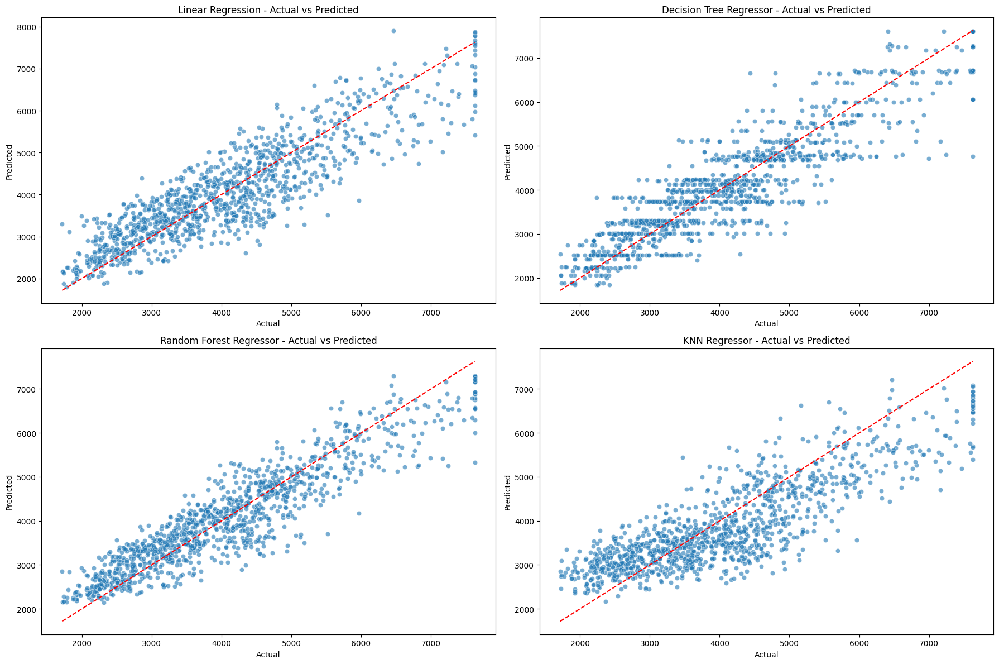

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18, 12))
for idx, (name, model) in enumerate(models):
    plt.subplot(2, 2, idx + 1)

    if name == "KNN Regressor":
        y_pred = model.predict(x_test_scaled)
    else:
        y_pred = model.predict(X_test)

    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # identity line
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'{name} - Actual vs Predicted')

plt.tight_layout()
plt.show()

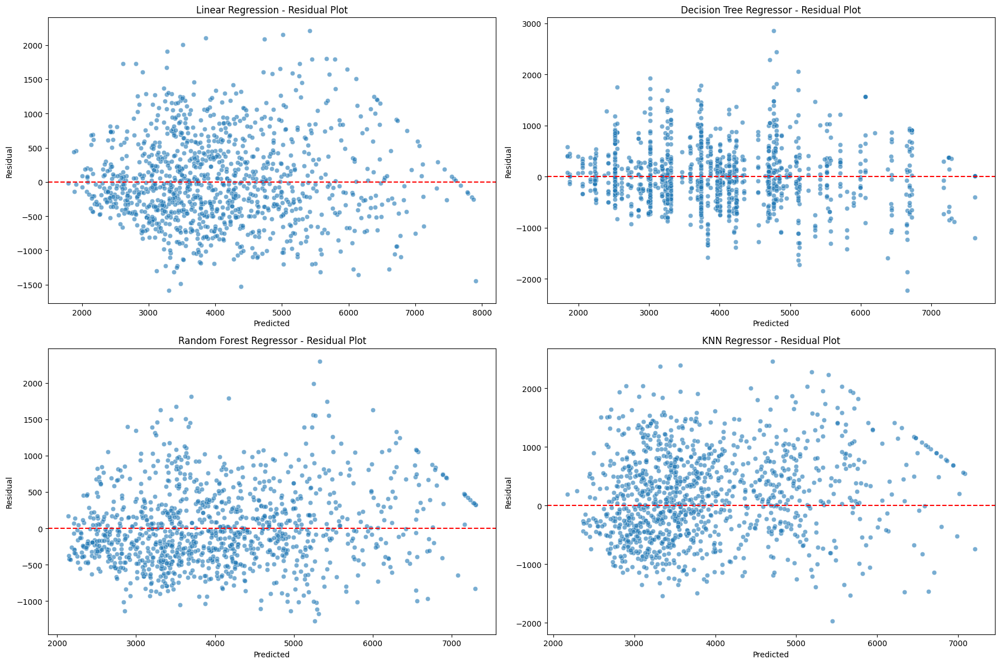

In [122]:
plt.figure(figsize=(18, 12))
for idx, (name, model) in enumerate(models):
    plt.subplot(2, 2, idx + 1)

    if name == "KNN Regressor":
        y_pred = model.predict(x_test_scaled)
    else:
        y_pred = model.predict(X_test)

    residuals = y_test - y_pred
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel('Predicted')
    plt.ylabel('Residual')
    plt.title(f'{name} - Residual Plot')

plt.tight_layout()
plt.show()


/tmp/ipython-input-123-2704403034.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=summary_df.index, y=summary_df['Test RMSE'], palette='viridis')


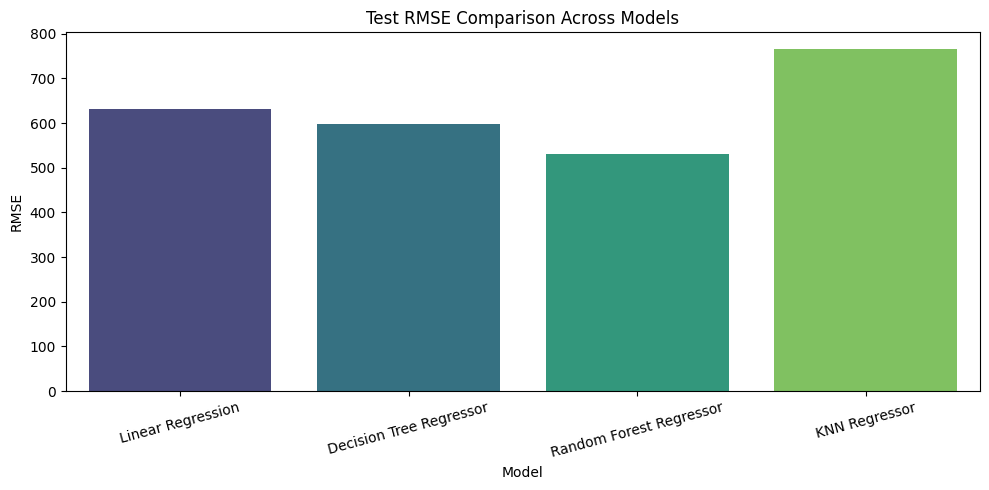

In [123]:
plt.figure(figsize=(10, 5))
sns.barplot(x=summary_df.index, y=summary_df['Test RMSE'], palette='viridis')
plt.title('Test RMSE Comparison Across Models')
plt.ylabel('RMSE')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()
